# **FDS - Final Project: Classification of Fake and Real Faces**

## **Custom CNN**

In this notebook we implement a CNN model to classify fake and real images from this dataset: https://www.kaggle.com/datasets/xhlulu/140k-real-and-fake-faces. We use hyperparameter tuning to try different combinations of loss function, learning rate and regularization, and save all results on the cloud (this notebook was executed on Colab).

#### **Performance Evaluation and Explainability**

* Accuracy, Precision, Recall, F1-Scores
* Confusion Matrix
* Grad-CAM
* ROC curve and AUC score
* Precision-Recall curve


#### Import libraries

In [ ]:
pip install grad-cam

In [ ]:
!pip install torchcam

In [3]:
import pandas as pd
import os
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import InterpolationMode
from torchvision import models
from torchvision import transforms
from PIL import Image
import random
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from sklearn.metrics import confusion_matrix, classification_report
from torchcam.methods import SmoothGradCAMpp, GradCAM
from torchvision.transforms.functional import to_pil_image
import seaborn as sns
import cv2
from google.colab import drive
from torchvision.models import ResNet50_Weights # Import ResNet50_Weights
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from torch.optim.lr_scheduler import StepLR
import copy
from collections import defaultdict

Mount Google Drive for saving results later.

In [4]:
from google.colab import drive
drive.mount('/content/drive')  # Mount Google Drive

Mounted at /content/drive


Set random seeds for reproducibility of results.

In [5]:
seed=42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

#### Import and read dataset

In [6]:
!kaggle datasets download -d xhlulu/140k-real-and-fake-faces

Dataset URL: https://www.kaggle.com/datasets/xhlulu/140k-real-and-fake-faces
License(s): other
100% 3.75G/3.75G [03:02<00:00, 24.1MB/s]
100% 3.75G/3.75G [03:02<00:00, 22.0MB/s]


In [ ]:
!unzip 140k-real-and-fake-faces.zip -d /content/

In [8]:
train_df = pd.read_csv('/content/train.csv', index_col=0)
test_df = pd.read_csv('/content/test.csv', index_col=0)
valid_df = pd.read_csv('/content/valid.csv', index_col=0)
print('Train Dataset Paths and Labels')
display(train_df.head())
print('Test Dataset Paths and Labels')
display(test_df.head())
print('Validation Dataset Paths and Labels')
display(valid_df.head())

Train Dataset Paths and Labels


,original_path,id,label,label_str,path
0,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,31355,1,real,train/real/31355.jpg
1,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,02884,1,real,train/real/02884.jpg
2,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,33988,1,real,train/real/33988.jpg
3,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,53875,1,real,train/real/53875.jpg
4,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,24149,1,real,train/real/24149.jpg


Test Dataset Paths and Labels


,original_path,id,label,label_str,path
0,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,18233,1,real,test/real/18233.jpg
1,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,54317,1,real,test/real/54317.jpg
2,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,40155,1,real,test/real/40155.jpg
3,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,12875,1,real,test/real/12875.jpg
4,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,52543,1,real,test/real/52543.jpg


Validation Dataset Paths and Labels


,original_path,id,label,label_str,path
0,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,20001,1,real,valid/real/20001.jpg
1,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,11264,1,real,valid/real/11264.jpg
2,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,19817,1,real,valid/real/19817.jpg
3,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,46851,1,real,valid/real/46851.jpg
4,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,10411,1,real,valid/real/10411.jpg


Adjust paths in the `path` columns

In [9]:
# Base directory where images are stored
base_img_dir = '/content/real_vs_fake/real-vs-fake/'

# Combine the base path with the relative paths from the 'path' column
train_df['image_path'] = train_df['path'].apply(lambda x: os.path.join(base_img_dir, x))
valid_df['image_path'] = valid_df['path'].apply(lambda x: os.path.join(base_img_dir, x))
test_df['image_path'] = test_df['path'].apply(lambda x: os.path.join(base_img_dir, x))

#### Visualize some images

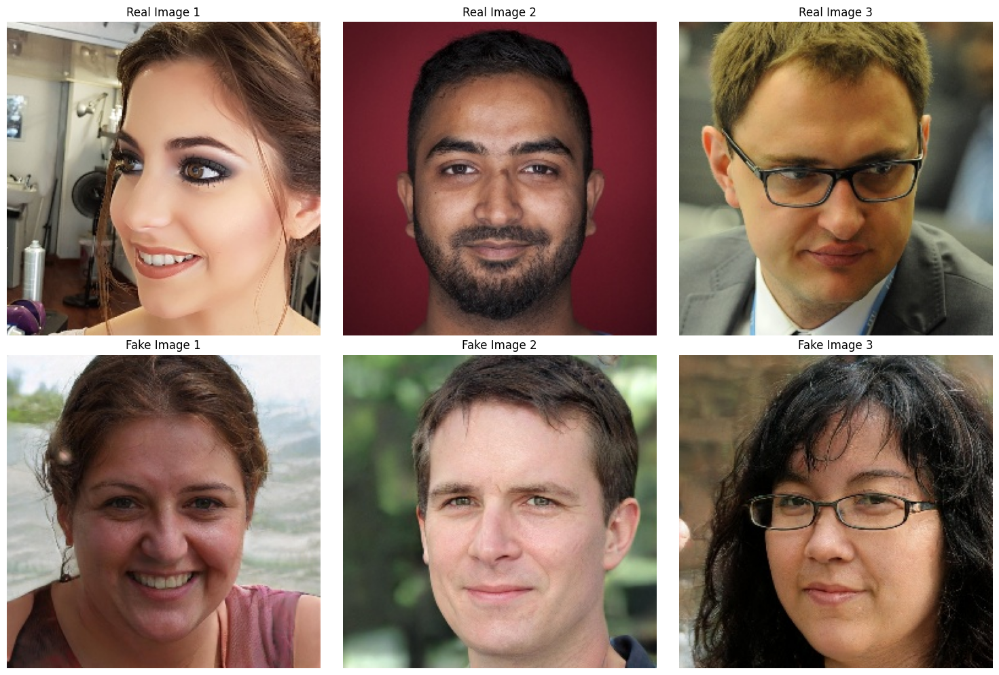

In [10]:
# Pick 3 real and 3 fake images to show
real_imgs_to_show = random.sample(list(train_df[train_df.label == 1].image_path), 3)
fake_imgs_to_show = random.sample(list(train_df[train_df.label == 0].image_path), 3)

# Open images using PIL
real_images = [Image.open(path) for path in real_imgs_to_show]
fake_images = [Image.open(path) for path in fake_imgs_to_show]

# Display images side by side using Matplotlib
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Add real images in the first row
for ax, img, title in zip(axes[0], real_images, ["Real Image 1", "Real Image 2", "Real Image 3"]):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis("off")

# Add fake images in the second row
for ax, img, title in zip(axes[1], fake_images, ["Fake Image 1", "Fake Image 2", "Fake Image 3"]):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()

#### Create FaceDataset class
We create a FaceDataset class that can be passed to a DataLoader, which will take care of batching and shuffling.

In [11]:
class FaceDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        '''
        Args:
            dataframe (pd.DataFrame): DataFrame containing image paths and labels
            transform (callable, optional): Optional transform to be applied on a sample
        '''
        self.dataframe = dataframe  # Store the dataframe
        self.transform = transform  # Store the transform (if present)

    def __len__(self):
        return len(self.dataframe)  # Return the length of the dataframe

    def __getitem__(self, idx):
        # Get the image path and label from the dataframe
        img_path = self.dataframe.iloc[idx].image_path
        label = int(self.dataframe.iloc[idx].label)  # Label is 0 or 1 (fake or real)

        # Open the image using PIL
        image = Image.open(img_path)

        # Apply transformations if specified
        if self.transform:
            image = self.transform(image)

        return image, label  # Return image and label

## Building a Custom CNN

Here we build a custom CNN with four convolutional layers, three of which include pooling, a layer for flattening and three fully connected layers.

In [81]:
class CustomCNN(nn.Module):

    def __init__(self):
        super(CustomCNN, self).__init__()

        # First Convolutional layer
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(32)  # Batch normalization

        # ReLU activation
        self.relu = nn.ReLU()

        # Pooling layer
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Second Convolutional layer
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(64)  # Batch normalization

        # Third Convolutional layer
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(128)  # Batch normalization

        # Fourth Convolutional layer
        self.conv4 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1)
        self.bn4 = nn.BatchNorm2d(256)  # Batch normalization

        # Flatten Layer: Converts 2D feature map into 1D vector
        self.flatten = nn.Flatten()

        # Dropout
        self.dropout = nn.Dropout(0.5)

        # Fully Connected Layer 1: 512 neurons
        self.fc1 = nn.Linear(256 * 32 * 32, 512)

        # Fully Connected Layer 2: 256 neurons
        self.fc2 = nn.Linear(512, 256)

        # Fully Connected Layer 3: 2 neurons
        self.fc3 = nn.Linear(256, 2)

    def forward(self, x):
        # First Convolutional layer
        x = self.pool(self.relu(self.bn1(self.conv1(x))))

        # Second Convolutional layer
        x = self.relu(self.bn2(self.conv2(x)))

        # Third Convolutional layer
        x = self.pool(self.relu(self.bn3(self.conv3(x))))

        # Fourth Convolutional layer
        x = self.pool(self.relu(self.bn4(self.conv4(x))))

        # Flatten Layer
        x = self.flatten(x)

        # Fully Connected Layer 1
        x = self.dropout(self.relu(self.fc1(x)))

        # Fully Connected Layer 2
        x = self.dropout(self.relu(self.fc2(x)))

        # Fully Connected Layer 3
        x = self.fc3(x)

        return x



Here we define transformations to pass the input images to our model. We also define a transform for data augmentation purposes, which will be used later. `model = CustomCNN()` initializes the CNN.

In [60]:
# Specify input transformations to pass it to the model
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize the image if needed
    transforms.ToTensor(),  # Convert the image to a tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize using ImageNet mean and std
])

# Data augmentation transforms (later)
augmentation_transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize the image if needed
    transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
    transforms.RandomRotation(20),  # Random rotation within a 20-degree range
    transforms.ToTensor(),  # Convert pytorch tensor and scale pixel values to [0, 1]
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize using ImageNet mean and std
])

# Initialize the custom CNN
model = CustomCNN()

Next, we make training, validation, test dataset and dataloader instances:

In [61]:
# Create Dataset instances for train, validation, and test sets
train_dataset = FaceDataset(dataframe=train_df, transform=transform)
valid_dataset = FaceDataset(dataframe=valid_df, transform=transform)
test_dataset = FaceDataset(dataframe=test_df, transform=transform)

# Create DataLoader instances for efficient batching and shuffling
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

Switch to GPU if available:

In [62]:
# Set device to cuda if it is available
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Move model to the right device
model.to(device)

CustomCNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU()
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=262144, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=256, bias=True)
  (

### Experiment Codes

To keep the notebook organized, we made specific functions that handle the execution of the experiments, creating and saving result figures for performance evaluation and visualization, and create grad-cam heatmaps.

* `experiment`: function that performs training, validation, testing, prints results and returns the trained model + full results in a dictionary
* `get_grad_cam_images`: function that computes the Grad-CAM heatmaps for a selection of images. We use conv4 as target layer for Grad-CAM
* `plot_figures`: function that generates plots with loss and accuracy curves, ROC curve, Precision-Recall curve, confusion matrices

In [26]:
def experiment(train_loader, valid_loader, test_loader, model, loss_function, optimizer, num_epochs, lr, weight_decay=0, momentum=0):
    '''
    Function that performs training, validation and testing on a model, given a loss function, optimizer, and hyper-parameters.
    The function returns the results of training the model
    Args:
    - train_loader (DataLoader): DataLoader for training set
    - valid_loader (DataLoader): DataLoader for validation set
    - test_loader (DataLoader): DataLoader for test set
    - model (nn.Module): Model to train
    - loss_function (nn.Module): Loss function to use
    - optimizer (torch.optim): Optimizer to use
    - lr (float): Learning rate for optimizer
    - weight_decay (float): Weight decay for optimizer
    - momentum (float): Momentum for optimizer
    - num_epochs (int): Number of epochs to train for
    Returns:
    - model (nn.Module): Trained model
    - results (dict): Dictionary containing training and validation loss and accuracy for each epoch + other results
    '''
    # Set device to cuda if it is available
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # Move model to the right device
    model.to(device)

    # Define Loss function
    if loss_function == 'CrossEntropyLoss':
        criterion = nn.CrossEntropyLoss()  # Cross-entropy loss
    elif loss_function == 'BCEWithLogitsLoss':
        criterion = nn.BCEWithLogitsLoss()  # Binary cross-entropy loss

    # Define optimizer function
    if optimizer == 'Adam':
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay) # Adam optimizer
    elif optimizer == 'SGD':
        optimizer = optim.SGD(model.parameters(), lr=lr, weight_decay=weight_decay, momentum=momentum) # SGD optimizer

    # Initialize lists for accuracies, losses, Grad-CAM images, probabilities of predicting class 1
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []
    true_labels = []
    pred_labels = []
    probs = []

    num_epochs = num_epochs

    # Iterate over the epochs
    for epoch in range(num_epochs):
        # Training Phase
        model.train()  # Set the model to training mode
        train_running_loss = 0.0
        correct, total = 0, 0
        prob = []

        # Iterate over the batches
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)  # Move to GPU if available

            # Set parameter gradients to zero
            optimizer.zero_grad()

            # Forward pass
            outputs = model(images)

            # Compute loss
            if loss_function == 'BCEWithLogitsLoss':
                # convert labels to float and ensure single-channel output
                loss = criterion(outputs[:, 1], labels.float())
            elif loss_function == 'CrossEntropyLoss':
                loss = criterion(outputs, labels)

            # Backward pass
            loss.backward()

            # Optimization
            optimizer.step()

            # Increase training loss
            train_running_loss += loss.item()

            # Calculate accuracy
            predicted = torch.max(outputs, 1)[1]  # Get predicted class
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        # Calculate average loss for the training epoch
        avg_train_loss = train_running_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Calculate training accuracy
        train_accuracy = correct / total
        train_accuracies.append(train_accuracy)

        print(f'Epoch {epoch+1}: Training Loss = {avg_train_loss:.4f}, Training Accuracy = {train_accuracy:.4f}')

        # Validation Phase
        model.eval()  # Set model to evaluation mode
        val_running_loss = 0.0
        val_correct, val_total = 0, 0

        # Initialize label lists for this epoch
        epoch_true_labels = []
        epoch_pred_labels = []

        # Iterate over the batches in valid_loader
        for val_inputs, val_labels in valid_loader:
            # Move to device
            val_inputs, val_labels = val_inputs.to(device), val_labels.to(device)

            # Forward pass
            val_outputs = model(val_inputs)

            with torch.no_grad():  # no need to compute gradients here

                # Compute loss
                if loss_function == 'BCEWithLogitsLoss':
                    # convert labels to float and ensure single-channel output
                    val_loss = criterion(val_outputs[:, 1], val_labels.float())
                elif loss_function == 'CrossEntropyLoss':
                    val_loss = criterion(val_outputs, val_labels)

                # Increase validation loss
                val_running_loss += val_loss.item()

                # Calculate accuracy
                val_predicted = torch.max(val_outputs, 1)[1]  # Get predicted class
                val_total += val_labels.size(0)
                val_correct += (val_predicted == val_labels).sum().item()

                # Memorize true and predicted labels for explainability
                epoch_true_labels.extend(val_labels.cpu().numpy())
                epoch_pred_labels.extend(val_predicted.cpu().numpy())

            # Calculate probabilities for prediction = class 1 (real) using softmax
            prob.extend(torch.softmax(val_outputs, dim=1)[:, 1].cpu().detach().numpy())

        # Calculate average loss for the validation epoch
        avg_val_loss = val_running_loss / len(valid_loader)
        val_losses.append(avg_val_loss)

        # Calculate validation accuracy
        val_accuracy = val_correct / val_total
        val_accuracies.append(val_accuracy)

        # Append results to the probs, true_labels, pred_labels lists
        probs.append(prob)
        true_labels.append(epoch_true_labels)
        pred_labels.append(epoch_pred_labels)

        print(f'Epoch {epoch+1}: Validation Loss = {avg_val_loss:.4f}, Validation Accuracy = {val_accuracy:.4f}')

    print('Finished Training')

    # confusion matrix
    conf_matrix = confusion_matrix(true_labels[-1], pred_labels[-1])

    # Get predictions on the test set
    model.eval()

    with torch.no_grad(): # no need to compute gradients here

        test_predictions = []
        test_true_labels = []

        # Iterate over the batches in test_loader
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device) # move to device
            outputs = model(images) # compute output
            _, predicted = torch.max(outputs, 1) # get prediction
            test_predictions.extend(predicted.cpu().numpy())
            test_true_labels.extend(labels.cpu().numpy())

    # Calculate metrics
    accuracy = accuracy_score(test_true_labels, test_predictions)
    precision = precision_score(test_true_labels, test_predictions, average='binary')
    recall = recall_score(test_true_labels, test_predictions, average='binary')
    f1 = f1_score(test_true_labels, test_predictions, average='binary')
    roc_auc = roc_auc_score(test_true_labels, test_predictions)

    # Print the results
    print('\nTest Results')
    print(f'Test Accuracy: {accuracy:.4f}')
    print(f'Test Precision: {precision:.4f}')
    print(f'Test Recall: {recall:.4f}')
    print(f'Test F1 Score: {f1:.4f}')
    print(f'Test ROC AUC: {roc_auc:.4f}')

    # Test Confusion Matrix
    test_conf_matrix = confusion_matrix(test_true_labels, test_predictions)

    report = classification_report(true_labels[-1], pred_labels[-1], target_names=['Fake', 'Real'])
    print("\nClassification Report:\n", report)

    # Put results in a dictionary
    results = {
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_losses': train_losses,
        'val_losses': val_losses,
        'train_accuracies': train_accuracies,
        'val_accuracies': val_accuracies,
        'true_labels': true_labels,
        'pred_labels': pred_labels,
        'probs': probs,
        'test_true_labels': test_true_labels,
        'test_predictions': test_predictions,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'roc_auc': roc_auc,
        'conf_matrix': conf_matrix,
        'test_conf_matrix': test_conf_matrix
      }

    return model, results

In [66]:
def get_grad_cam_images(model, transform, target_layer, real_images, fake_images, path):
    '''
    Function that takes a trained model and returns Grad-CAM results for a selection of real and fake image paths
    Args:
    - model (nn.Module): Trained model
    - transform (torchvision.transforms): Image transformations
    - target_layer (nn.Module): Target layer for Grad-CAM
    - real_images (list): List of real image paths
    - fake_images (list): List of fake image paths
    - path (str): Path to save Grad-CAM images
    Returns:
    - None
    '''
    # Set the model to evaluation mode
    model.eval()

    # Initialize Grad-CAM
    cam = GradCAM(model=model, target_layers=[target_layer])

    # Function to process an image and generate Grad-CAM heatmap
    def generate_gradcam_overlay(img_path, target_class):
        # Load and preprocess the image
        image = Image.open(img_path).convert('RGB')
        img_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device

        # Convert the image to a NumPy array for visualization
        img_for_visualization = np.array(image.resize((256, 256))) / 255.0  # Scale to [0, 1]

        # Generate Grad-CAM heatmap
        grayscale_cam = cam(input_tensor=img_tensor, targets=[ClassifierOutputTarget(target_class)])
        heatmap = grayscale_cam[0, :]  # Extract the heatmap

        # Overlay heatmap on the image
        superimposed_img = show_cam_on_image(img_for_visualization, heatmap, use_rgb=True)

        # Get model prediction
        with torch.no_grad():
            output = model(img_tensor)
            pred_class = output.argmax(dim=1).item()

        return superimposed_img, pred_class

    # Create subplots
    fig, axes = plt.subplots(2, len(real_images), figsize=(15, 10))

    # First row: Real images
    for i, img_path in enumerate(real_images):
        target_class = 1  # Actual label for real images
        superimposed_img, pred_class = generate_gradcam_overlay(img_path, target_class)
        axes[0, i].imshow(superimposed_img)
        axes[0, i].set_title(f'Real Image {i+1}\nPred: {pred_class}, Actual: {target_class}')
        axes[0, i].axis('off')

    # Second row: Fake images
    for i, img_path in enumerate(fake_images):
        target_class = 0  # Actual label for fake images
        superimposed_img, pred_class = generate_gradcam_overlay(img_path, target_class)
        axes[1, i].imshow(superimposed_img)
        axes[1, i].set_title(f'Fake Image {i+1}\nPred: {pred_class}, Actual: {target_class}')
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.savefig(path)
    plt.show()

In [19]:
def plot_figures(results, path, num_epochs):
    '''
    Function that, given training, validation and test results, plots and saves images
    Args:
    - results (dict): Dictionary containing training, validation and test results
    - path (str): Path to save images
    - num_epochs (int): Number of epochs
    Returns:
    - None
    '''

    train_losses = results['train_losses']
    val_losses = results['val_losses']
    train_accuracies = results['train_accuracies']
    val_accuracies = results['val_accuracies']
    true_labels = results['true_labels']
    pred_labels = results['pred_labels']
    probs = results['probs']
    conf_matrix = results['conf_matrix']
    test_conf_matrix = results['test_conf_matrix']

    plt.figure(figsize=(15, 16))

    # Training and validation loss curves
    plt.subplot(3, 2, 1)
    plt.plot(range(1, num_epochs+1), train_losses, label='Trainining Loss')
    plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()

    # Training and validation accuracy curves
    plt.subplot(3, 2, 2)
    plt.plot(range(1, num_epochs+1), train_accuracies, label='Training Accuracy')
    plt.plot(range(1, num_epochs+1), val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    # ROC curve
    fpr, tpr, _ = roc_curve(true_labels[-1], probs[-1])

    plt.subplot(3, 2, 3)
    plt.plot(fpr, tpr, color='blue', label='ROC Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.grid()

    # Precision-Recall curve
    precision, recall, _ = precision_recall_curve(true_labels[-1], probs[-1])

    plt.subplot(3, 2, 4)
    plt.plot(recall, precision, color='green', label='Precision-Recall Curve')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend()
    plt.grid()

    # Confusion Matrix Validation

    # Plot the confusion matrix
    plt.subplot(3,2,5)
    sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', cbar=True, xticklabels=['Fake','Real'], yticklabels=['Fake','Real'])
    plt.title('Validation Confusion Matrix (last epoch)')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')

    # Confusion Matrix Testing
    plt.subplot(3,2,6)
    sns.heatmap(test_conf_matrix, annot=True, fmt='g', cmap='Blues', cbar=True, xticklabels=['Fake','Real'], yticklabels=['Fake','Real'])
    plt.title('Test Confusion Matrix')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.savefig(path)
    plt.show()

### Cross Entropy Loss + Adam Optimizer + learning rate = 0.01

In [63]:
# Create a copy of resnet50
CustomCNN_CE_Adam_01 = copy.deepcopy(model)
CustomCNN_CE_Adam_01, results_CE_Adam_01 = experiment(train_loader, valid_loader, test_loader, CustomCNN_CE_Adam_01, loss_function = 'CrossEntropyLoss', optimizer = 'Adam', num_epochs = 10, lr = 0.01)

Epoch 1: Training Loss = 4.6452, Training Accuracy = 0.5019
Epoch 1: Validation Loss = 0.6934, Validation Accuracy = 0.5000
Epoch 2: Training Loss = 0.6957, Training Accuracy = 0.5031
Epoch 2: Validation Loss = 0.6933, Validation Accuracy = 0.5000
Epoch 3: Training Loss = 0.6958, Training Accuracy = 0.5027
Epoch 3: Validation Loss = 0.6945, Validation Accuracy = 0.5000
Epoch 4: Training Loss = 0.6934, Training Accuracy = 0.5024
Epoch 4: Validation Loss = 0.6932, Validation Accuracy = 0.5000
Epoch 5: Training Loss = 0.6935, Training Accuracy = 0.4994
Epoch 5: Validation Loss = 0.6931, Validation Accuracy = 0.5000
Epoch 6: Training Loss = 0.6934, Training Accuracy = 0.5002
Epoch 6: Validation Loss = 0.6934, Validation Accuracy = 0.5000
Epoch 7: Training Loss = 0.6934, Training Accuracy = 0.5013
Epoch 7: Validation Loss = 0.6943, Validation Accuracy = 0.5000
Epoch 8: Training Loss = 0.6935, Training Accuracy = 0.4994
Epoch 8: Validation Loss = 0.6935, Validation Accuracy = 0.5000
Epoch 9:

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


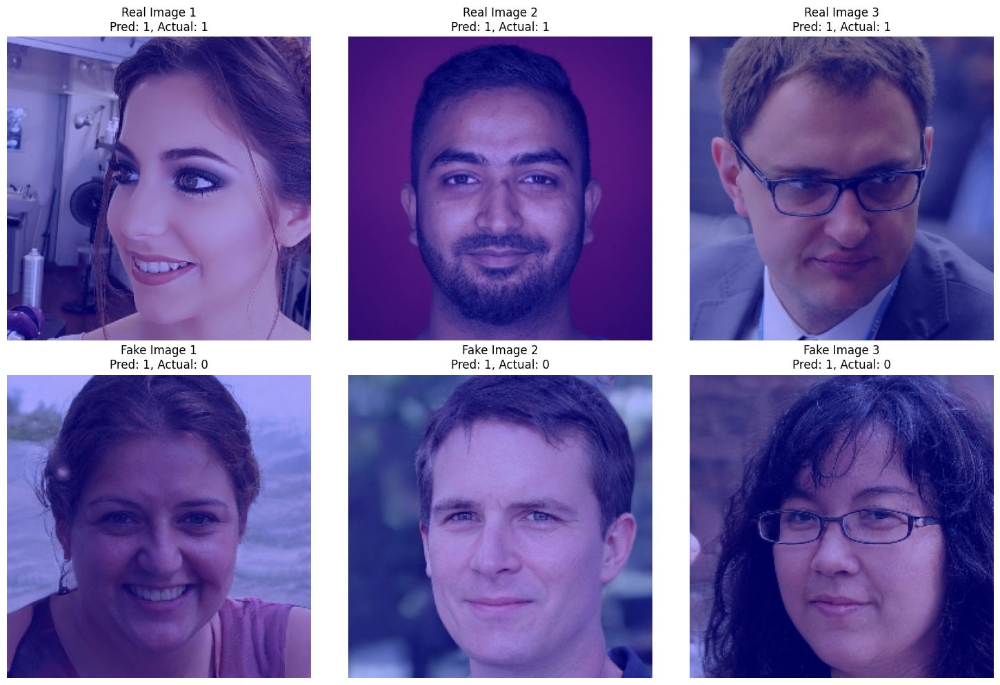

In [72]:
target_layer = CustomCNN_CE_Adam_01.conv4 # last convolutional layer
get_grad_cam_images(CustomCNN_CE_Adam_01, transform, target_layer, real_imgs_to_show, fake_imgs_to_show, '/content/drive/MyDrive/CustomCNN/grad_cam_CE_Adam_01.png')

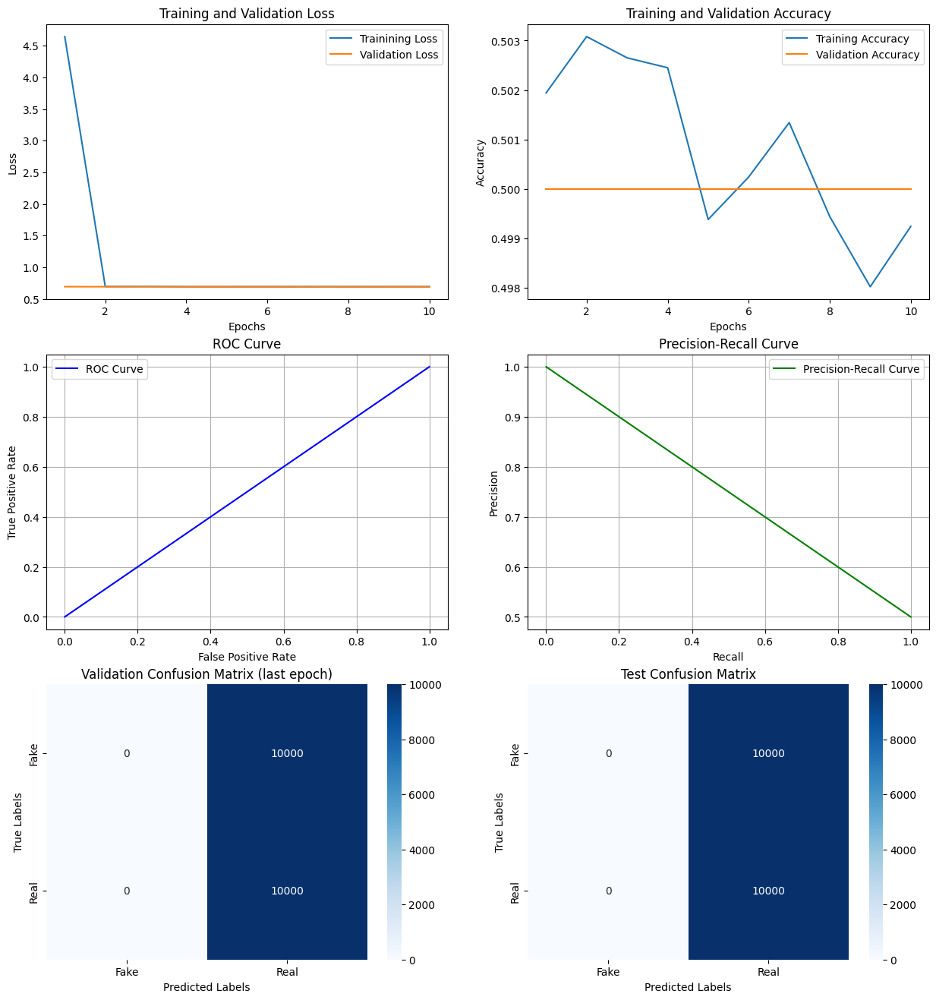

In [74]:
CE_Adam_01_path ='/content/drive/MyDrive/CustomCNN/CE_Adam_01.png'
plot_figures(results_CE_Adam_01, CE_Adam_01_path, 10)

In [75]:
# Save results on google drive
torch.save(results_CE_Adam_01, '/content/drive/MyDrive/CustomCNN/results_CE_Adam_01.pth')

### BCE With Logits Loss + Adam Optimizer + learning rate 0.001

In [64]:
# Create a copy of the model
CustomCNN_BCE_SGD_001_mom = copy.deepcopy(model)
CustomCNN_BCE_SGD_001_mom, results_BCE_SGD_001_mom = experiment(train_loader, valid_loader, test_loader, CustomCNN_BCE_SGD_001_mom, loss_function = 'BCEWithLogitsLoss', optimizer = 'SGD', num_epochs = 10, lr = 0.001, momentum=0.9)

Epoch 1: Training Loss = 0.5180, Training Accuracy = 0.7339
Epoch 1: Validation Loss = 0.3973, Validation Accuracy = 0.8017
Epoch 2: Training Loss = 0.4457, Training Accuracy = 0.7667
Epoch 2: Validation Loss = 0.3778, Validation Accuracy = 0.8538
Epoch 3: Training Loss = 0.4399, Training Accuracy = 0.7481
Epoch 3: Validation Loss = 0.2908, Validation Accuracy = 0.9133
Epoch 4: Training Loss = 0.4014, Training Accuracy = 0.7834
Epoch 4: Validation Loss = 0.1996, Validation Accuracy = 0.9356
Epoch 5: Training Loss = 0.3354, Training Accuracy = 0.8291
Epoch 5: Validation Loss = 0.1346, Validation Accuracy = 0.9597
Epoch 6: Training Loss = 0.3025, Training Accuracy = 0.8468
Epoch 6: Validation Loss = 0.1028, Validation Accuracy = 0.9704
Epoch 7: Training Loss = 0.2881, Training Accuracy = 0.8532
Epoch 7: Validation Loss = 0.0744, Validation Accuracy = 0.9745
Epoch 8: Training Loss = 0.2813, Training Accuracy = 0.8561
Epoch 8: Validation Loss = 0.1062, Validation Accuracy = 0.9639
Epoch 9:

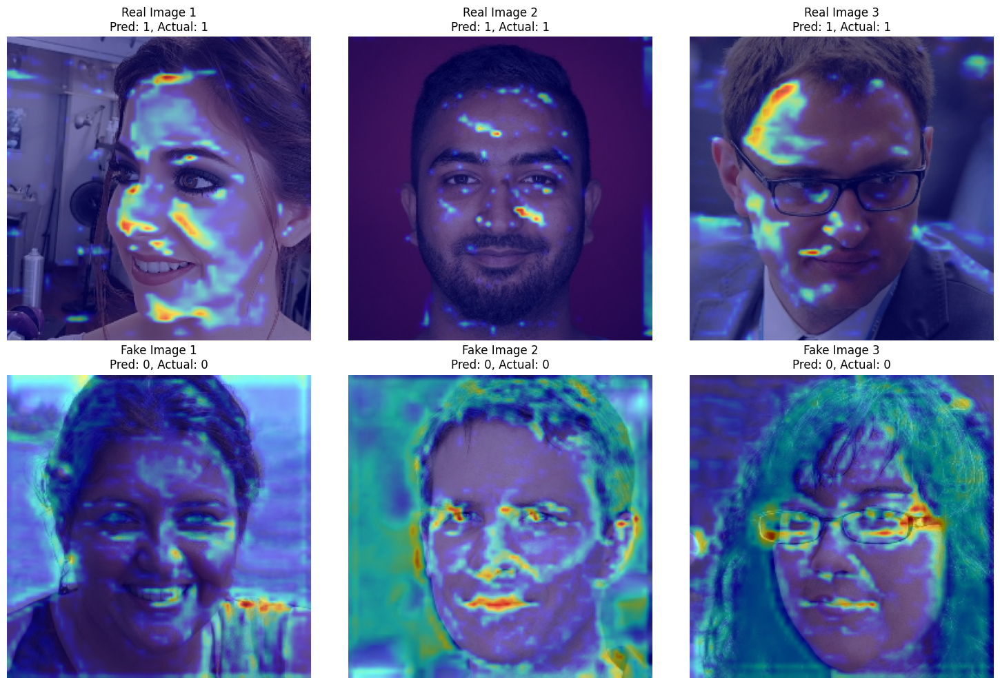

In [69]:
target_layer = CustomCNN_BCE_SGD_001_mom.conv4 # last convolutional layer
get_grad_cam_images(CustomCNN_BCE_SGD_001_mom, transform, target_layer, real_imgs_to_show, fake_imgs_to_show, '/content/drive/MyDrive/CustomCNN/grad_cam_BCE_SGD_001_mom.png')

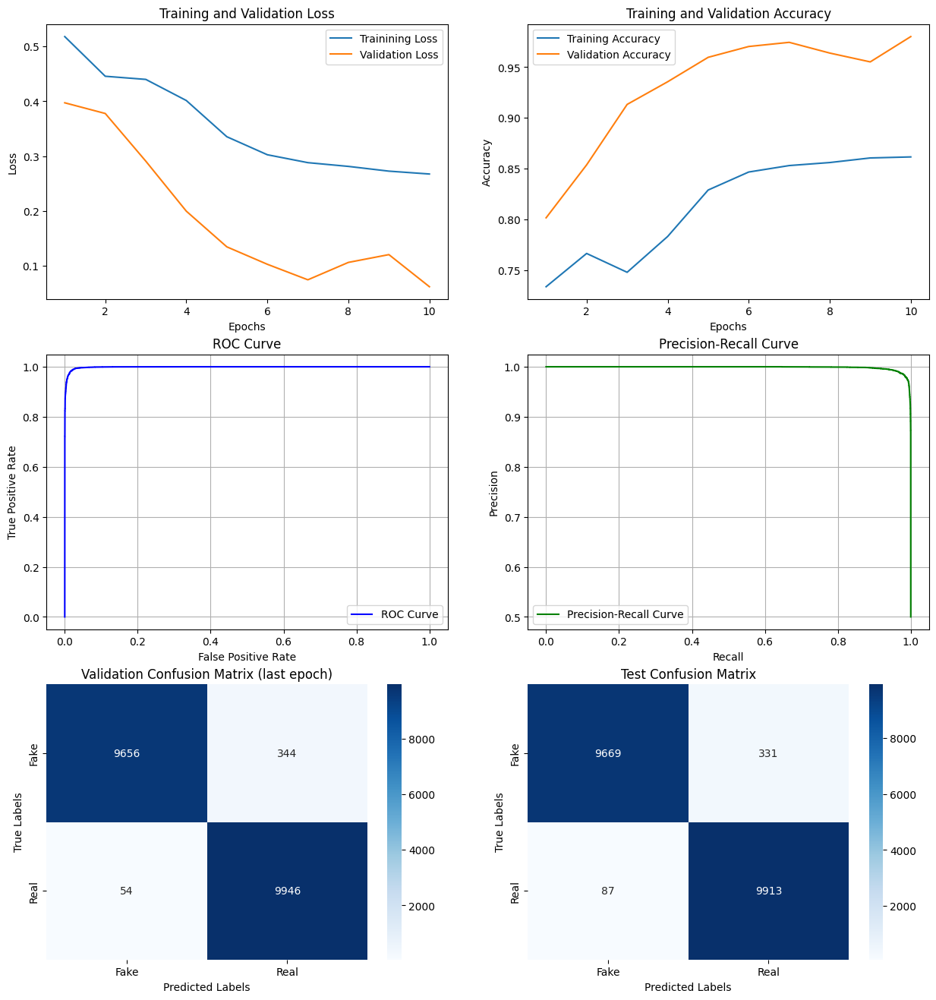

In [71]:
path = '/content/drive/MyDrive/CustomCNN/BCE_SGD_001_mom.png'
plot_figures(results_BCE_SGD_001_mom, path, 10)

In [76]:
torch.save(results_CE_Adam_01, '/content/drive/MyDrive/CustomCNN/BCE_SGD_001_mom.pth')

### Cross Entropy Loss + SGD + lr=0.0001 + momentum=0.9

In [77]:
CustomCNN_CE_SGD_0001_mom = copy.deepcopy(model)
CustomCNN_CE_SGD_0001_mom, results_CE_SGD_0001_mom = experiment(train_loader, valid_loader, test_loader, CustomCNN_CE_SGD_0001_mom, loss_function = 'CrossEntropyLoss', optimizer = 'SGD', num_epochs = 10, lr = 0.0001, momentum=0.9)

Epoch 1: Training Loss = 0.5585, Training Accuracy = 0.7117
Epoch 1: Validation Loss = 0.4448, Validation Accuracy = 0.7972
Epoch 2: Training Loss = 0.4150, Training Accuracy = 0.8131
Epoch 2: Validation Loss = 0.3264, Validation Accuracy = 0.8623
Epoch 3: Training Loss = 0.3091, Training Accuracy = 0.8711
Epoch 3: Validation Loss = 0.2351, Validation Accuracy = 0.9069
Epoch 4: Training Loss = 0.2275, Training Accuracy = 0.9092
Epoch 4: Validation Loss = 0.1840, Validation Accuracy = 0.9269
Epoch 5: Training Loss = 0.1767, Training Accuracy = 0.9306
Epoch 5: Validation Loss = 0.1374, Validation Accuracy = 0.9480
Epoch 6: Training Loss = 0.1417, Training Accuracy = 0.9466
Epoch 6: Validation Loss = 0.1103, Validation Accuracy = 0.9582
Epoch 7: Training Loss = 0.1071, Training Accuracy = 0.9613
Epoch 7: Validation Loss = 0.1444, Validation Accuracy = 0.9431
Epoch 8: Training Loss = 0.0837, Training Accuracy = 0.9704
Epoch 8: Validation Loss = 0.0849, Validation Accuracy = 0.9670
Epoch 9:

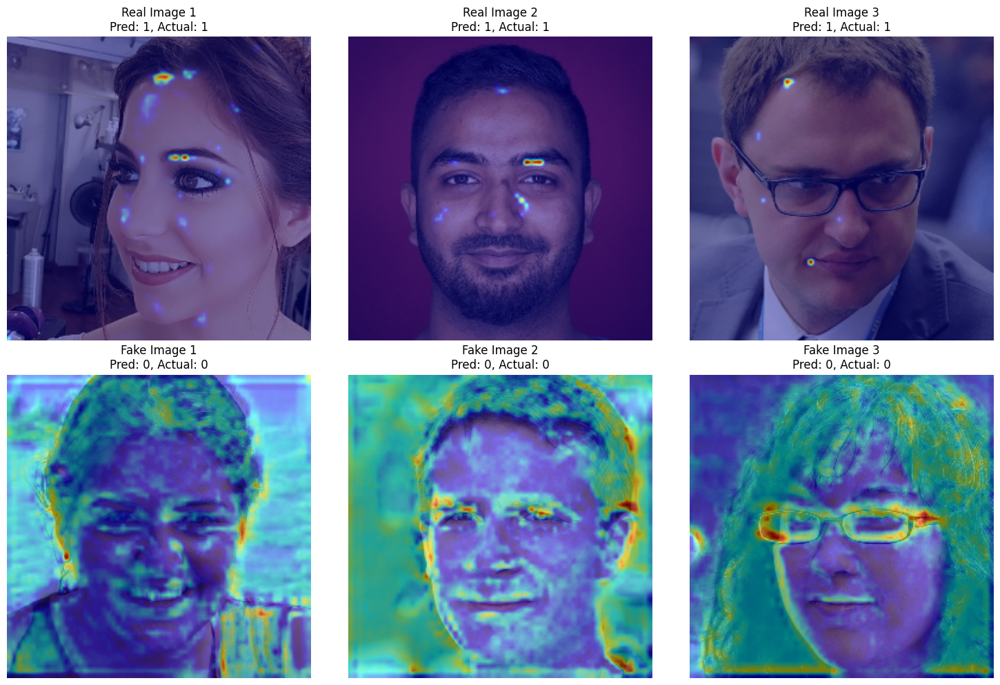

In [78]:
target_layer = CustomCNN_CE_SGD_0001_mom.conv4 # last convolutional layer
get_grad_cam_images(CustomCNN_CE_SGD_0001_mom, transform, target_layer, real_imgs_to_show, fake_imgs_to_show, '/content/drive/MyDrive/CustomCNN/grad_cam_CE_SGD_0001_mom.png')

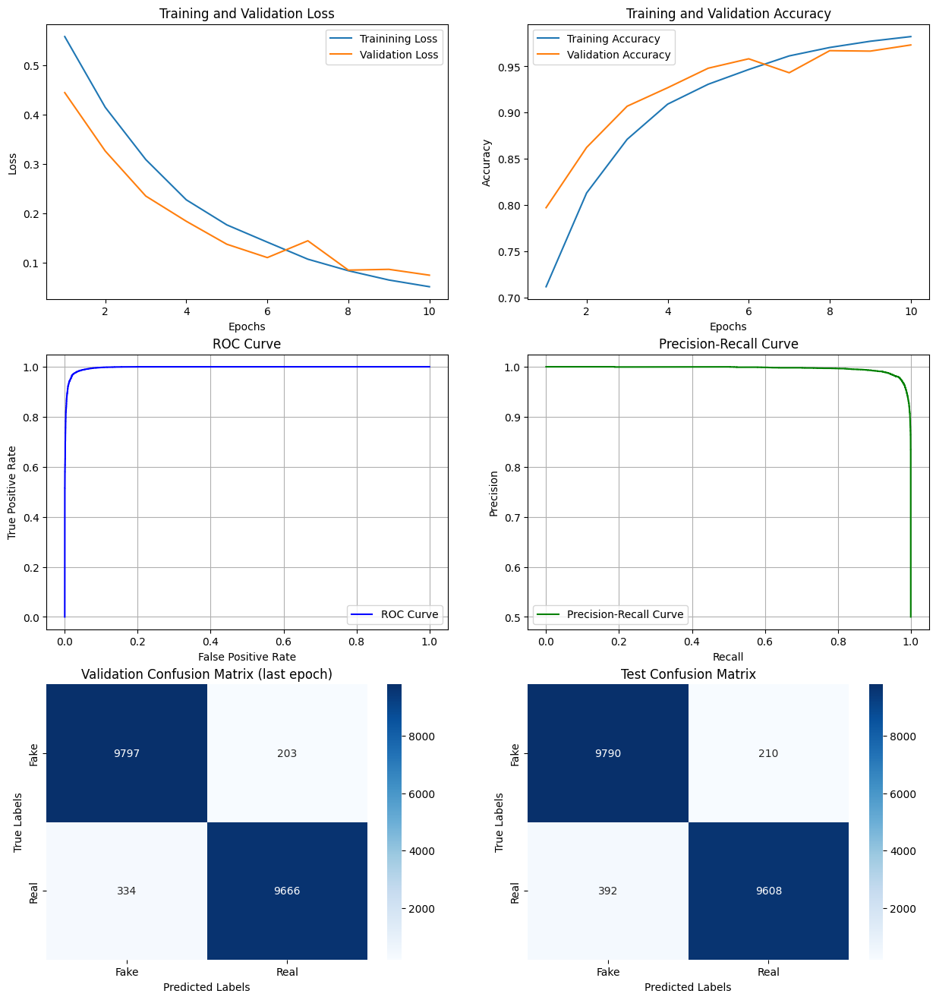

In [84]:
plot_figures(results_CE_SGD_0001_mom, '/content/drive/MyDrive/CustomCNN/CE_SGD_0001_mom.png', 10)

In [80]:
torch.save(results_CE_Adam_01, '/content/drive/MyDrive/CustomCNN/CE_SGD_0001_mom.pth')

### Adding a Layer

We try changing the architecture a little by adding another convolutional layer, and save that model in another class CustomCNN2. Then we run more experiments on the new model.

In [82]:
class CustomCNN2(nn.Module):

    def __init__(self):
        super(CustomCNN2, self).__init__()

        # First Convolutional layer
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(32)

        # ReLU activation
        self.relu = nn.ReLU()

        # Pooling layer
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Second Convolutional layer
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(64)

        # Third Convolutional layer
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(128)

        # Fourth Convolutional layer
        self.conv4 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1)
        self.bn4 = nn.BatchNorm2d(256)

        # Fifth Convolutional layer
        self.conv5 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1)
        self.bn5 = nn.BatchNorm2d(512)

        # Flatten Layer: Converts 2D feature map into 1D vector
        self.flatten = nn.Flatten()

        # Dropout
        self.dropout = nn.Dropout(0.5)

        # Fully Connected Layer 1
        self.fc1 = nn.Linear(512 * 16 * 16, 512)

        # Fully Connected Layer 2
        self.fc2 = nn.Linear(512, 256)

        # Fully Connected Layer 3
        self.fc3 = nn.Linear(256, 2)

    def forward(self, x):
        # First Convolutional layer
        x = self.pool(self.relu(self.bn1(self.conv1(x))))

        # Second Convolutional layer
        x = self.relu(self.bn2(self.conv2(x)))

        # Third Convolutional layer
        x = self.pool(self.relu(self.bn3(self.conv3(x))))

        # Fourth Convolutional layer
        x = self.pool(self.relu(self.bn4(self.conv4(x))))

        # Fifth Convolutional layer
        x = self.pool(self.relu(self.bn5(self.conv5(x))))

        # Flatten Layer
        x = self.flatten(x)

        # Fully Connected Layer 1
        x = self.dropout(self.relu(self.fc1(x)))

        # Fully Connected Layer 2
        x = self.dropout(self.relu(self.fc2(x)))

        # Fully Connected Layer 3
        x = self.fc3(x)

        return x


In [83]:
model2 = CustomCNN2()
model2.to(device)

CustomCNN2(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU()
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn5): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (

### CustomCNN2: BCE + SGD + lr=0.0001 + momentum=0.9

In [87]:
CustomCNN2_BCE_SGD_0001_mom = copy.deepcopy(model2)
CustomCNN2_BCE_SGD_0001_mom, results_BCE_SGD_0001_mom = experiment(train_loader, valid_loader, test_loader, CustomCNN2_BCE_SGD_0001_mom, loss_function = 'BCEWithLogitsLoss', optimizer = 'SGD', num_epochs = 10, lr = 0.0001, momentum=0.9)

Epoch 1: Training Loss = 0.5861, Training Accuracy = 0.6789
Epoch 1: Validation Loss = 0.4887, Validation Accuracy = 0.7662
Epoch 2: Training Loss = 0.4616, Training Accuracy = 0.7792
Epoch 2: Validation Loss = 0.3992, Validation Accuracy = 0.8204
Epoch 3: Training Loss = 0.3655, Training Accuracy = 0.8360
Epoch 3: Validation Loss = 0.3258, Validation Accuracy = 0.8600
Epoch 4: Training Loss = 0.2854, Training Accuracy = 0.8781
Epoch 4: Validation Loss = 0.2285, Validation Accuracy = 0.9062
Epoch 5: Training Loss = 0.2218, Training Accuracy = 0.9086
Epoch 5: Validation Loss = 0.1926, Validation Accuracy = 0.9225
Epoch 6: Training Loss = 0.1652, Training Accuracy = 0.9353
Epoch 6: Validation Loss = 0.1782, Validation Accuracy = 0.9226
Epoch 7: Training Loss = 0.1319, Training Accuracy = 0.9492
Epoch 7: Validation Loss = 0.1252, Validation Accuracy = 0.9507
Epoch 8: Training Loss = 0.0988, Training Accuracy = 0.9635
Epoch 8: Validation Loss = 0.0995, Validation Accuracy = 0.9626
Epoch 9:

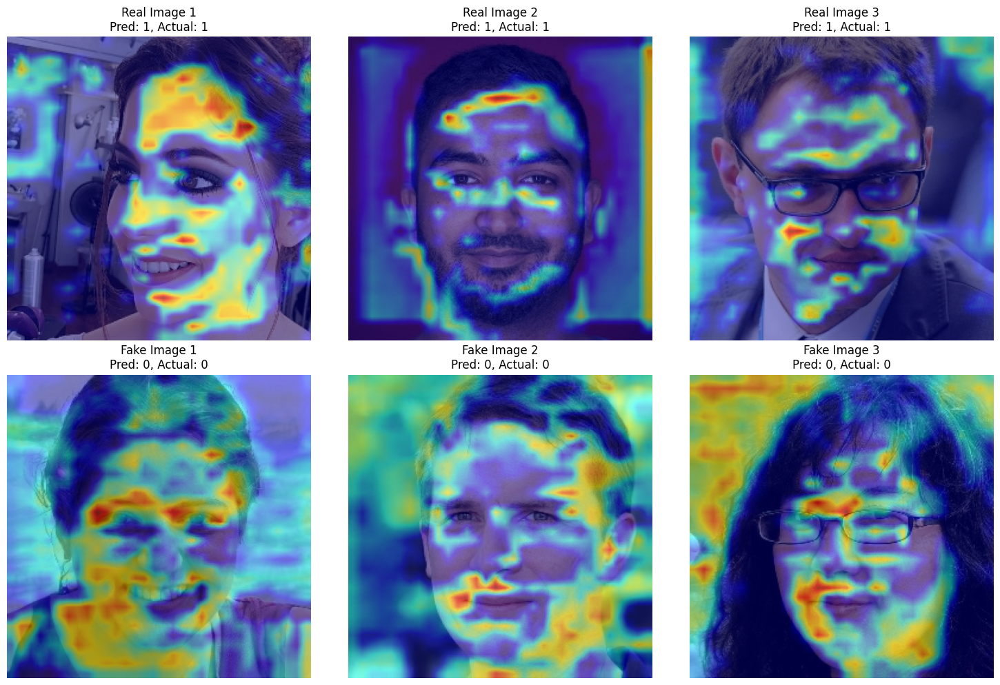

In [106]:
target_layer = CustomCNN2_BCE_SGD_0001_mom.conv5 # last convolutional layer
get_grad_cam_images(CustomCNN2_BCE_SGD_0001_mom, transform, target_layer, real_imgs_to_show, fake_imgs_to_show, '/content/drive/MyDrive/CustomCNN2/grad_cam_BCE_SGD_0001_mom09.png')

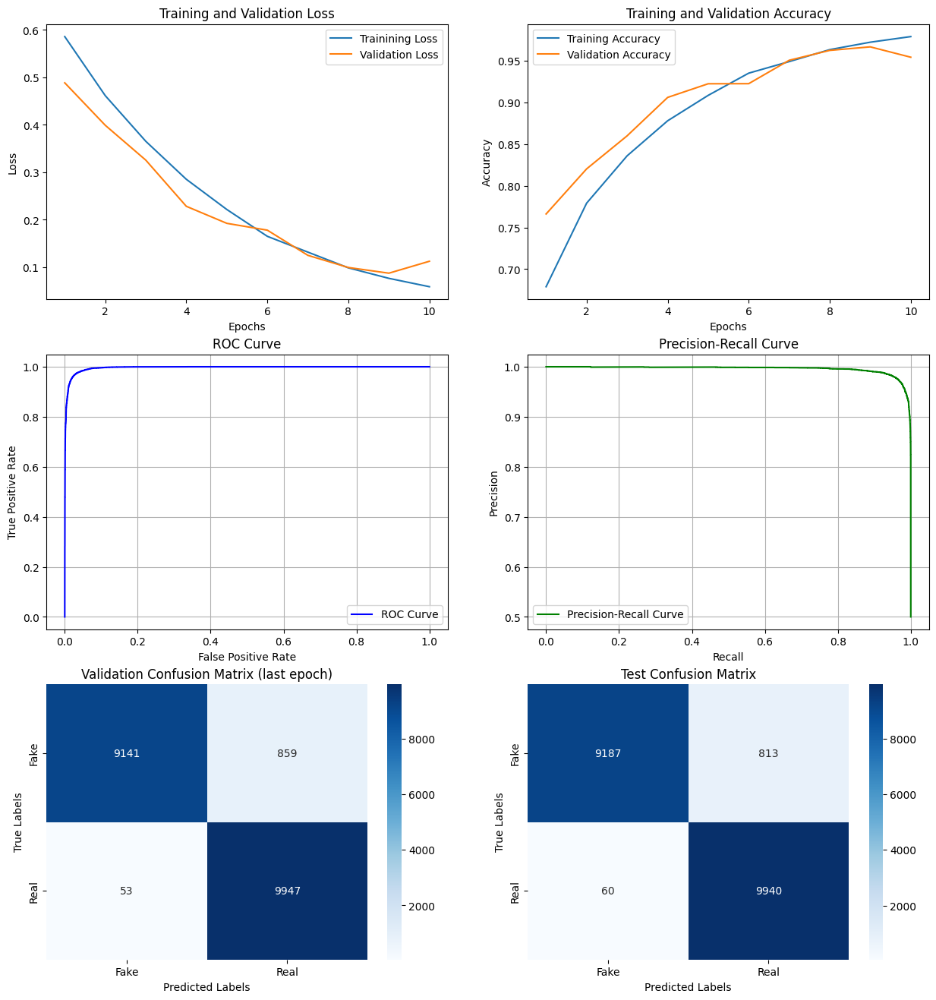

In [89]:
plot_figures(results_BCE_SGD_0001_mom, '/content/drive/MyDrive/CustomCNN2/BCE_SGD_0001_mom.png', 10)

In [107]:
torch.save(results_BCE_SGD_0001_mom, '/content/drive/MyDrive/CustomCNN2/BCE_SGD_0001_mom09.pth')

### CustomCNN2 + CE + Adam + lr=0.001 + weight_decay=0.001

In [91]:
CustomCNN2_CE_Adam_001_wd = copy.deepcopy(model2)
CustomCNN2_CE_Adam_001_wd, results_CE_Adam_001_wd = experiment(train_loader, valid_loader, test_loader, CustomCNN2_CE_Adam_001_wd, loss_function = 'CrossEntropyLoss', optimizer = 'Adam', num_epochs = 8, lr = 0.001, weight_decay=0.001)

Epoch 1: Training Loss = 0.8111, Training Accuracy = 0.5766
Epoch 1: Validation Loss = 0.5887, Validation Accuracy = 0.6985
Epoch 2: Training Loss = 0.4214, Training Accuracy = 0.8066
Epoch 2: Validation Loss = 0.3796, Validation Accuracy = 0.8318
Epoch 3: Training Loss = 0.2301, Training Accuracy = 0.9066
Epoch 3: Validation Loss = 0.1966, Validation Accuracy = 0.9392
Epoch 4: Training Loss = 0.1475, Training Accuracy = 0.9442
Epoch 4: Validation Loss = 0.1715, Validation Accuracy = 0.9417
Epoch 5: Training Loss = 0.1096, Training Accuracy = 0.9598
Epoch 5: Validation Loss = 0.1549, Validation Accuracy = 0.9301
Epoch 6: Training Loss = 0.0936, Training Accuracy = 0.9666
Epoch 6: Validation Loss = 0.0917, Validation Accuracy = 0.9679
Epoch 7: Training Loss = 0.0821, Training Accuracy = 0.9711
Epoch 7: Validation Loss = 0.0852, Validation Accuracy = 0.9674
Epoch 8: Training Loss = 0.0753, Training Accuracy = 0.9738
Epoch 8: Validation Loss = 0.1185, Validation Accuracy = 0.9586
Finished

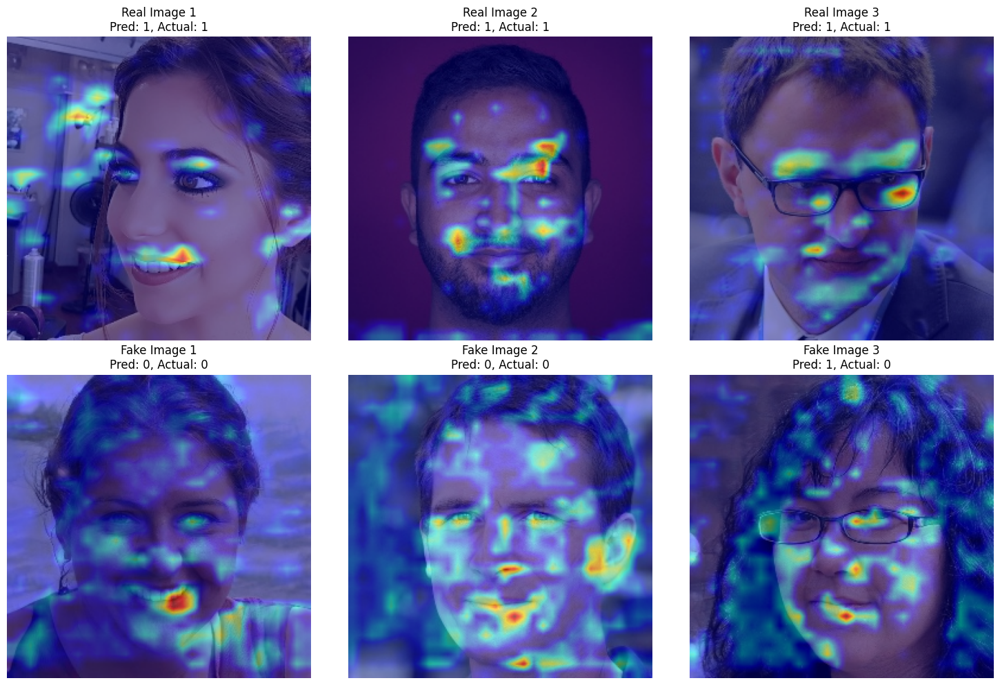

In [93]:
target_layer =CustomCNN2_CE_Adam_001_wd.conv5 # last convolutional layer
get_grad_cam_images(CustomCNN2_CE_Adam_001_wd, transform, target_layer, real_imgs_to_show, fake_imgs_to_show, '/content/drive/MyDrive/CustomCNN2/grad_cam_CE_Adam_001_wd.png')

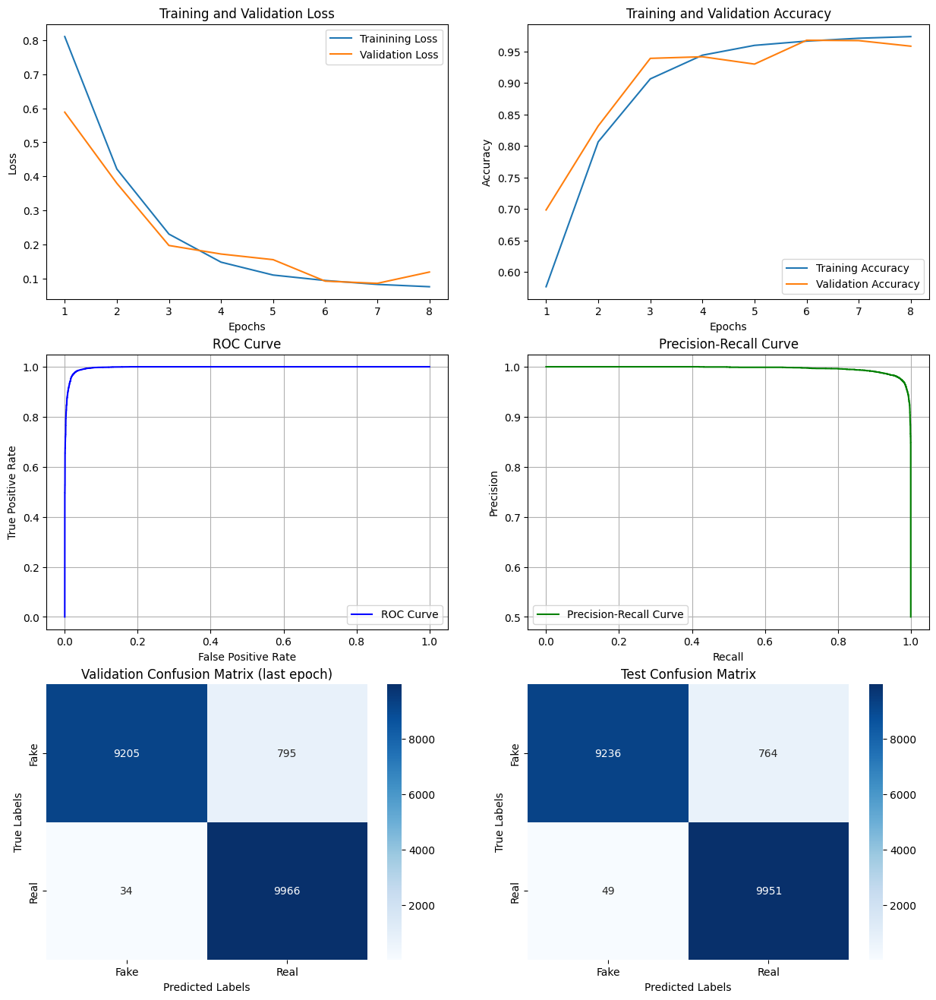

In [94]:
plot_figures(results_CE_Adam_001_wd, '/content/drive/MyDrive/CustomCNN2/CE_Adam_001_wd.png', 8)

In [95]:
torch.save(results_CE_Adam_001_wd, '/content/drive/MyDrive/CustomCNN2/CE_Adam_001_wd.pth')

### CustomCNN2 + Binary Cross Entropy + SGD + lr=0.0001 + momentum=0.99

In [102]:
CustomCNN2_BCE_SGD_0001_mom99 = copy.deepcopy(model2)
CustomCNN2_BCE_SGD_0001_mom99, results_BCE_SGD_0001_mom99 = experiment(train_loader, valid_loader, test_loader, CustomCNN2_BCE_SGD_0001_mom99, loss_function = 'BCEWithLogitsLoss', optimizer = 'SGD', num_epochs = 8, lr = 0.001, momentum=0.99)

Epoch 1: Training Loss = 0.5902, Training Accuracy = 0.6641
Epoch 1: Validation Loss = 0.4489, Validation Accuracy = 0.8088
Epoch 2: Training Loss = 0.4530, Training Accuracy = 0.7605
Epoch 2: Validation Loss = 0.2635, Validation Accuracy = 0.9033
Epoch 3: Training Loss = 0.3550, Training Accuracy = 0.8036
Epoch 3: Validation Loss = 0.2287, Validation Accuracy = 0.9027
Epoch 4: Training Loss = 0.3046, Training Accuracy = 0.8279
Epoch 4: Validation Loss = 0.1273, Validation Accuracy = 0.9497
Epoch 5: Training Loss = 0.2859, Training Accuracy = 0.8459
Epoch 5: Validation Loss = 0.0955, Validation Accuracy = 0.9685
Epoch 6: Training Loss = 0.2289, Training Accuracy = 0.8544
Epoch 6: Validation Loss = 0.0582, Validation Accuracy = 0.9784
Epoch 7: Training Loss = 0.2198, Training Accuracy = 0.8576
Epoch 7: Validation Loss = 0.0546, Validation Accuracy = 0.9837
Epoch 8: Training Loss = 0.2114, Training Accuracy = 0.8609
Epoch 8: Validation Loss = 0.0394, Validation Accuracy = 0.9853
Finished

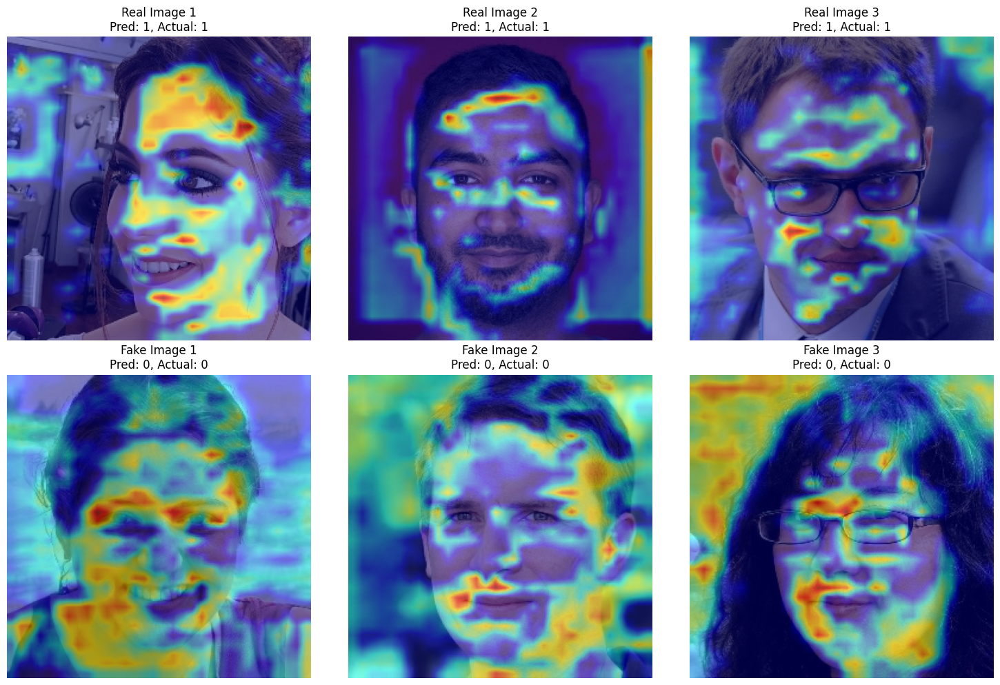

In [103]:
target_layer = CustomCNN2_BCE_SGD_0001_mom99.conv5 # last convolutional layer
get_grad_cam_images(CustomCNN2_BCE_SGD_0001_mom99, transform, target_layer, real_imgs_to_show, fake_imgs_to_show, '/content/drive/MyDrive/CustomCNN2/grad_cam_BCE_SGD_0001_mom99.png')

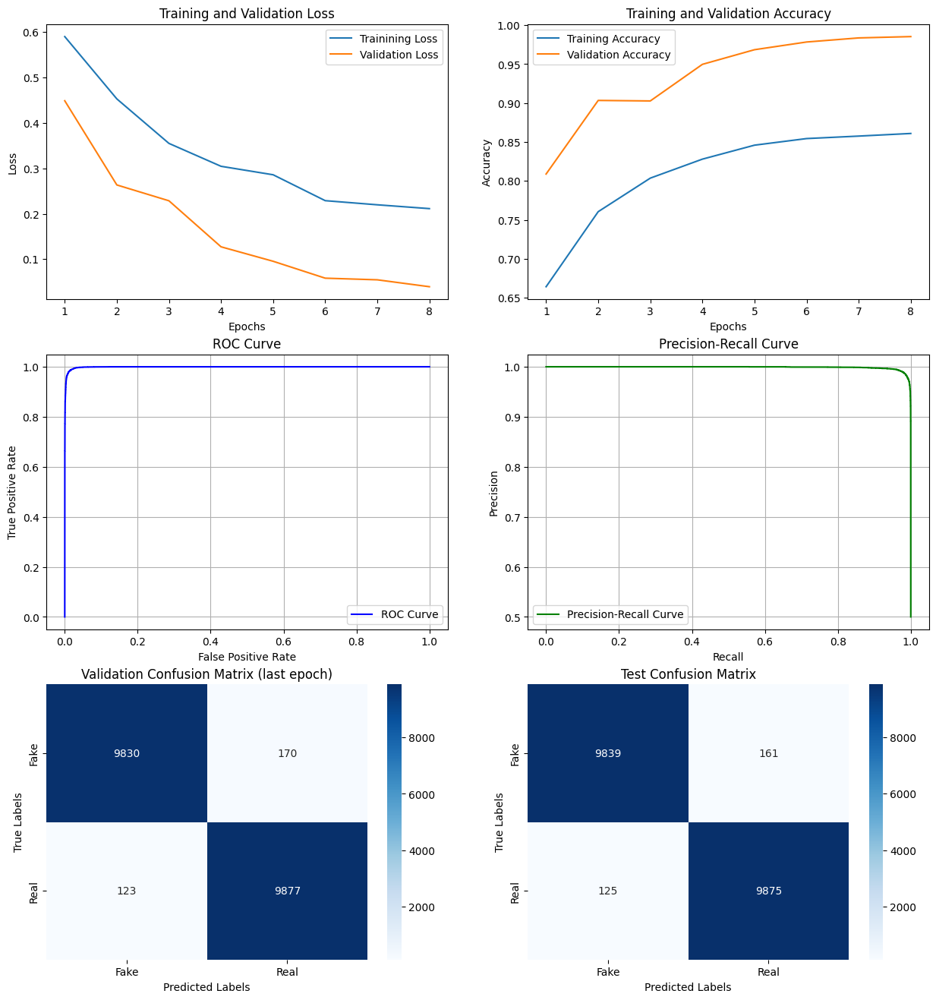

In [104]:
plot_figures(results_BCE_SGD_0001_mom99, '/content/drive/MyDrive/CustomCNN2/results_BCE_SGD_0001_mom99.png', 8)

In [105]:
torch.save(results_BCE_SGD_0001_mom99, '/content/drive/MyDrive/CustomCNN2/results_BCE_SGD_0001_mom99.pth')